# Introduction:

The general scope of the project is to find new ways to explore country demographics and other indicators such as voting patterns via the use of satellite imagery and mapping techniques.

Let's import some libraries:

In [2]:
import os
import rasterio as rio
import earthpy as et
import earthpy.spatial as es
import earthpy.plot as ep
import rasterio
from rasterio.plot import plotting_extent
import numpy as np
import pandas as pd
import geopandas as gpd
from affine import Affine
from pyproj import Proj, transform
from osgeo import gdal
import imageio as io
from skimage.transform import resize
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon
import scipy.misc
import matplotlib.pyplot as plt
%matplotlib inline

# Part I: Looking at the UK

Initial attention was draw due to the UK Elections (vote on 12th Dec) and to see what some data and mapping could tell us about the make up of the UK.

### Compiling together the input data:

First, let's look at some of our maps:

In [3]:
map_england = gpd.read_file('topo_wpc.json')
map_scotland = gpd.read_file('scotland.json')
map_ni = gpd.read_file('ni.json')
map_wales = gpd.read_file('wales.json')

map_england['Country'] = 'England'
map_scotland['Country'] = 'Scotland'
map_wales['Country'] = 'Wales'
map_ni['Country'] = 'Northern Ireland'


map_Britain = pd.concat([map_england, map_scotland, map_wales], sort=True)
map_UK = pd.concat([map_england, map_scotland, map_wales, map_ni], sort=True)

In [11]:
type(map_Britain)

geopandas.geodataframe.GeoDataFrame

Text(0.5, 1, 'Constituency Map UK')

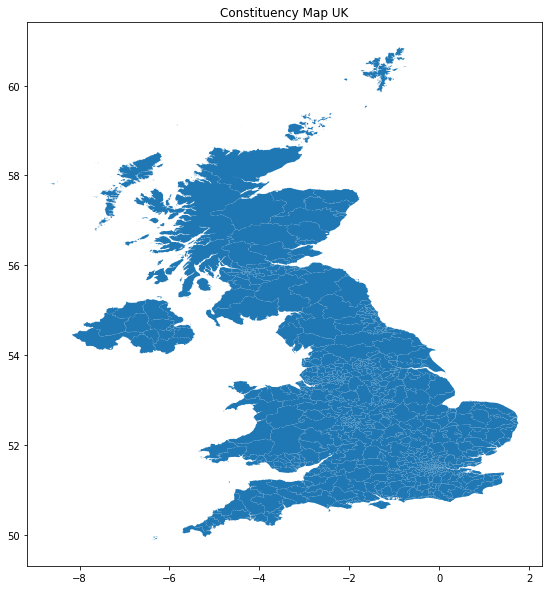

In [16]:
fig, ax = plt.subplots(1, figsize=(10,10))
map_UK.plot(ax=ax)
plt.title('Constituency Map UK')

But let's look at some better data, what about the UK at night?

- For reference, the .tif data below is taken from VIIRS satellite image publicly available
- The file UK_new_new.tif is cropped using GDAL and is just used for demonstrative purposes now

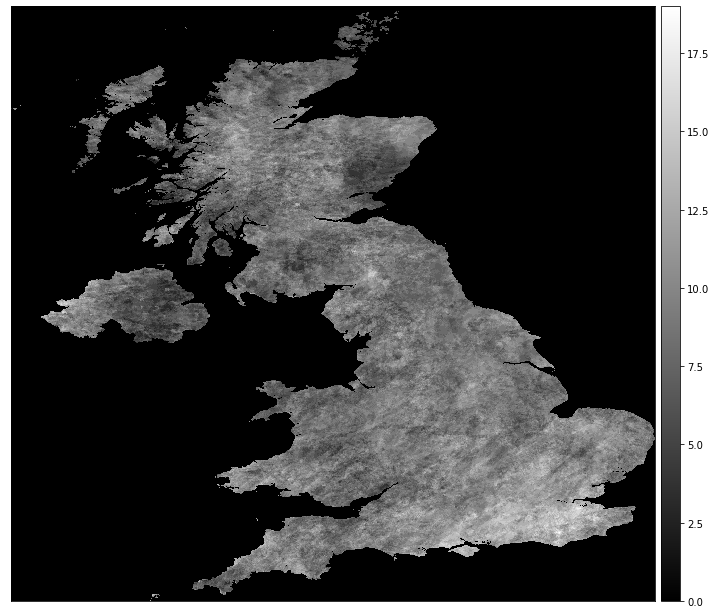

In [19]:
crop_geometry = map_UK.geometry[:] #this is the geometry from which we will 

with rio.open('Satellite_data/UK_new_new.tif') as src:
    test_crop, meta = es.crop_image(src, crop_geometry)
    test_crop=test_crop.astype('uint8')
    
test_crop_affine = meta["transform"]
# Create spatial plotting extent for the cropped layer
test_crop_extent = plotting_extent(test_crop[0], test_crop_affine)

ep.plot_bands(test_crop[0], cmap='gray')#, extent = test_crop_extent)
plt.show()

This is good, but let's get a better visualization of the different lights. The above includes cloud light as well which we will not consider for our purposes:

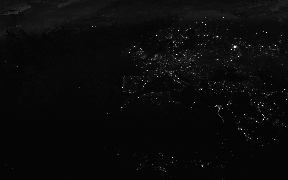

In [21]:
#Below you can see an example of a satellite image from night
from IPython.display import Image
Image("Tile2_75N060W.png")

Let's first take an example of the world at night (1992):

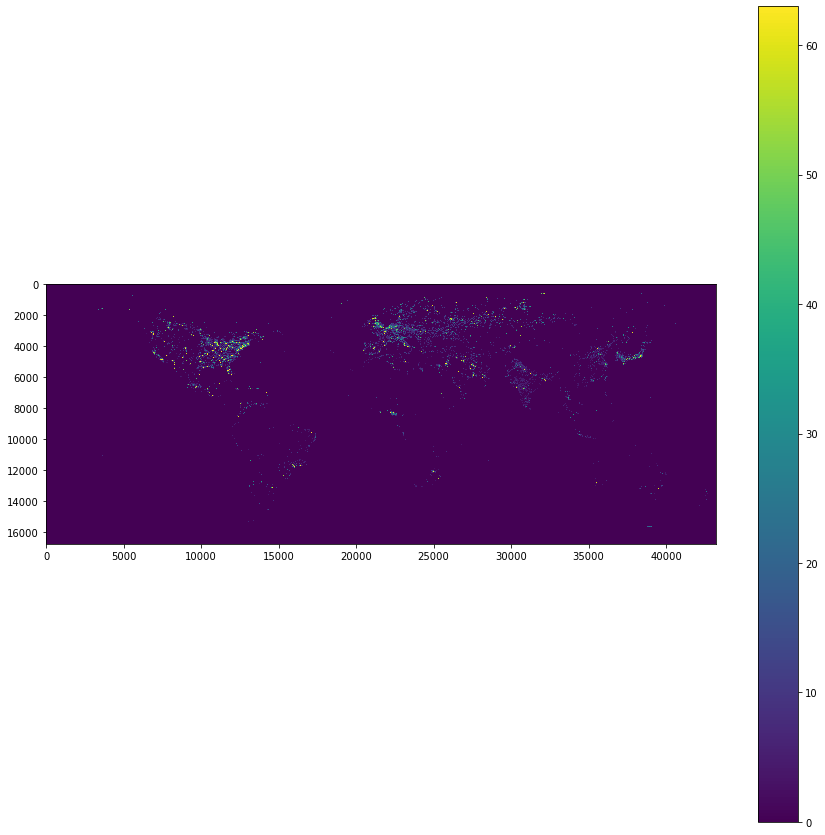

In [23]:
World_1992 = rio.open('/users/laurencewilliams/downloads/F101992.v4/F101992.v4b_web.stable_lights.avg_vis.tif')
World_1992 = World_1992.read()
World_1992 = np.squeeze(World_1992)

fig, ax = plt.subplots(1, figsize=(15,15))
plt.imshow(World_1992)
plt.colorbar()
plt.show()

Can we make sense of this? Can we get coordinates? Yes:

In [29]:
def get_coords(file, x,y):
    with rasterio.open(file) as map_layer:
        pixels2coords = map_layer.xy(x,y)
    return pixels2coords

def get_pixels(file, long, lat):
    with rasterio.open(file) as map_layer:
        coords2pixels = map_layer.index(long, lat)
    return coords2pixels

In [30]:
#For example, if we want to find BTS:  2.190097, 41.397235
get_pixels('/users/laurencewilliams/downloads/F101992.v4/F101992.v4b_web.stable_lights.avg_vis.tif', 2.190097, 41.397235)

(4032, 21863)

But now let's focus more on the UK and its lights using the Average Visibility Stable Lights Tif file from 1992:

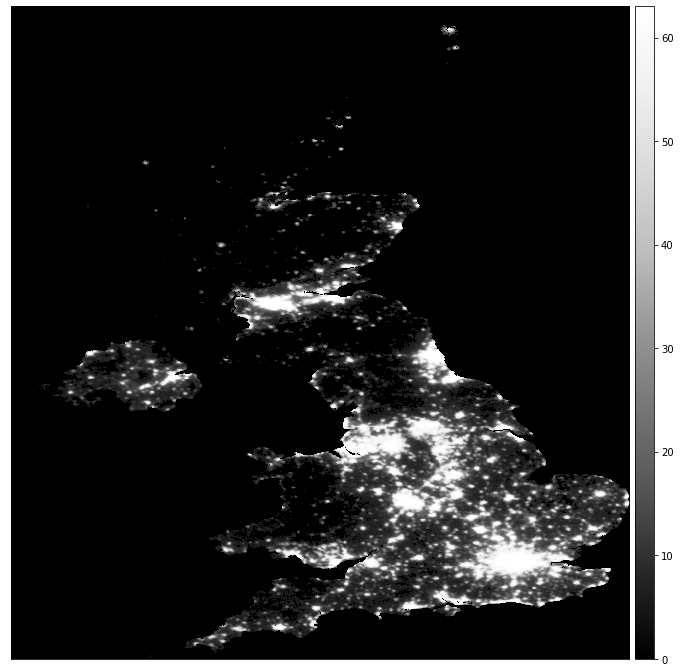

In [33]:
with rio.open('/users/laurencewilliams/downloads/F101992.v4/F101992.v4b_web.stable_lights.avg_vis.tif') as src:
    test_crop, meta = es.crop_image(src, crop_geometry)
    test_crop=test_crop.astype('uint8')
    
ep.plot_bands(test_crop[0])#, extent = test_crop_extent)
plt.show()

This gives us a good understanding of the urban layout of the UK. Now let's consider some of our output data for which we could find some sort of initial correlation.

### Compiling together the output, 'label' data:

To begin, whilst our map data is for all of the UK, some of the output data interested in is only available for England so we will focus on the England country data for now to stabilise whethere there is any correlation at all between lights in England and voting, population, demographics, etc. data that we will see below.

* Note: there are 533 constituencies in England

#### Let's look at population:

In [36]:
pd.set_option("max_rows", 1000)
pd.set_option("max_columns", 1000)

In [6]:
population_byyear = pd.read_excel('population-by-age.xlsx', sheet_name = 'Age by year data')
population_byyear.head()

,PCON11CD,PCON11NM,RegionID,RegionNM,All Ages,Age_year,Age_pop,Age_percent,Reg_percent,UK_percent
0,E14000530,Aldershot,E15000008,South East,105601,0,1419,0.013437,0.010786,0.011218
1,E14000530,Aldershot,E15000008,South East,105601,1,1341,0.012699,0.011216,0.011599
2,E14000530,Aldershot,E15000008,South East,105601,2,1429,0.013532,0.011750,0.011986
3,E14000530,Aldershot,E15000008,South East,105601,3,1478,0.013996,0.011928,0.011999
4,E14000530,Aldershot,E15000008,South East,105601,4,1344,0.012727,0.012046,0.012112


In [78]:
population_constituencies = population_byyear.groupby('PCON11CD').sum()

In [79]:
population_constituencies_england = population_constituencies[:533]

In [80]:
population_constituencies_england

,All Ages,Age_year,Age_pop,Age_percent,Reg_percent,UK_percent
PCON11CD,,,,,,
E14000530,9609691,4095,105601,1.0,1.0,1.0
E14000531,7050316,4095,77476,1.0,1.0,1.0
E14000532,9269351,4095,101861,1.0,1.0,1.0
E14000533,8246420,4095,90620,1.0,1.0,1.0
E14000534,9243689,4095,101579,1.0,1.0,1.0
E14000535,9746100,4095,107100,1.0,1.0,1.0
E14000536,11272261,4095,123871,1.0,1.0,1.0
E14000537,8426782,4095,92602,1.0,1.0,1.0
E14000538,11259612,4095,123732,1.0,1.0,1.0


In [81]:
pop_list = population_constituencies_england.Age_pop.to_list()

In [82]:
len(pop_list)

533

#### Let's look at deprivation levels:

In [51]:
deprivation = pd.read_excel('deprivation_by_constituency.xlsx', sheet_name = '2019 Scores')
deprivation.head(7)

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,English Indices of Deprivation 2019: constitue...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Constituencies are ranked based on their depri...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,Domains of deprivation,NaN,NaN,NaN,NaN,NaN,NaN,Supplementary indices,NaN
5,Constituency,Index of Multiple Deprivation,Income deprivation,Employment deprivation,"Education, skills and training deprivation",Health deprivation and disability,Crime,Barriers to housing and services,Living environment deprivation,Income deprivation affecting children index,Income deprivation affecting older people index
6,Aldershot,15,0.099,0.063,18.489,-0.234,-0.04,22.249,12.787,0.111,0.18


In [52]:
column_names = deprivation.iloc[5].to_list()

In [53]:
column_names

['Constituency',
 'Index of Multiple Deprivation',
 'Income deprivation',
 'Employment deprivation',
 'Education, skills and training deprivation',
 'Health deprivation and disability',
 'Crime',
 'Barriers to housing and services',
 'Living environment deprivation',
 'Income deprivation affecting children index',
 'Income deprivation affecting older people index']

In [54]:
deprivation = deprivation.drop([0,1,2,3,4,5])
deprivation.head()

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10
6,Aldershot,15,0.099,0.063,18.489,-0.234,-0.04,22.249,12.787,0.111,0.18
7,Aldridge-Brownhills,18.722,0.117,0.095,22.414,0.231,-0.359,17.156,18.367,0.155,0.14
8,Altrincham and Sale West,10.387,0.072,0.063,5.62,-0.439,-0.154,13.211,16.703,0.073,0.095
9,Amber Valley,20.896,0.126,0.109,31.667,0.27,-0.584,15.531,15.094,0.179,0.133
10,Arundel and South Downs,11.212,0.059,0.053,11.559,-0.854,-0.68,26.596,22.022,0.071,0.068


In [55]:
deprivation=deprivation.rename(columns = {deprivation.columns[0]: column_names[0], 
                              deprivation.columns[1] : column_names[1],
                             deprivation.columns[2] : column_names[2],
                              deprivation.columns[3] : column_names[3],
                             deprivation.columns[4] : column_names[4],
                             deprivation.columns[5] : column_names[5],
                             deprivation.columns[6] : column_names[6],
                             deprivation.columns[7] : column_names[7],
                             deprivation.columns[8] : column_names[8],
                             deprivation.columns[9] : column_names[9],
                             deprivation.columns[10] : column_names[10]})

In [56]:
deprivation.head()

,Constituency,Index of Multiple Deprivation,Income deprivation,Employment deprivation,"Education, skills and training deprivation",Health deprivation and disability,Crime,Barriers to housing and services,Living environment deprivation,Income deprivation affecting children index,Income deprivation affecting older people index
6,Aldershot,15,0.099,0.063,18.489,-0.234,-0.04,22.249,12.787,0.111,0.18
7,Aldridge-Brownhills,18.722,0.117,0.095,22.414,0.231,-0.359,17.156,18.367,0.155,0.14
8,Altrincham and Sale West,10.387,0.072,0.063,5.62,-0.439,-0.154,13.211,16.703,0.073,0.095
9,Amber Valley,20.896,0.126,0.109,31.667,0.27,-0.584,15.531,15.094,0.179,0.133
10,Arundel and South Downs,11.212,0.059,0.053,11.559,-0.854,-0.68,26.596,22.022,0.071,0.068


In [57]:
deprivation.tail(10)

,Constituency,Index of Multiple Deprivation,Income deprivation,Employment deprivation,"Education, skills and training deprivation",Health deprivation and disability,Crime,Barriers to housing and services,Living environment deprivation,Income deprivation affecting children index,Income deprivation affecting older people index
535,Wythenshawe and Sale East,34.854,0.2,0.153,28.17,1.019,0.621,20.782,21.913,0.25,0.229
536,Yeovil,18.394,0.104,0.087,22.351,-0.122,-0.164,22.045,22.621,0.146,0.102
537,York Central,15.824,0.094,0.067,22.231,-0.06,-0.348,14.962,24.323,0.143,0.136
538,York Outer,7.009,0.047,0.045,8.173,-0.612,-1.356,16.918,11.345,0.053,0.064
539,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
540,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
541,Note: constituency deprivation figures have be...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
542,(1) The exceptions are the scores for the Inco...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
543,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
544,Source: Department for Communities and Local G...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [58]:
deprivation = deprivation.drop([539, 540, 541, 542, 543, 544])

In [160]:
deprivation_rank = deprivation['Index of Multiple Deprivation'].to_list()

In [162]:
len(deprivation_rank)

533

#### Unemployment Claimants:

In [180]:
claimants = pd.read_excel('Claimants_Count.xls')

In [181]:
claimants = claimants[14:]
claimants = claimants.drop([43, 44, 45, 121,122,123,178,179,180, 227, 228, 229, 426, 427, 428, 513, 514, 515, 571, 572, 573])
claimants

,Unnamed: 0,Local area data,Unnamed: 2,"Under Universal Credit a broader span of claimants are required to look for work than under Jobseekers Allowance. As Universal Credit Full Service is rolled out in particular areas, the number of people recorded as being on the Claimant Count is therefore likely to rise.",Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17
14,E14000554,Berwick-upon-Tweed,580,445,1025,NaN,2.6,2,2.3,165.0,165,160,325,NaN,0.7,0.7,0.7,North East
15,E14000569,Bishop Auckland,1410,930,2335,NaN,5.2,3.4,4.3,30.0,30,75,105,NaN,0.1,0.3,0.2,North East
16,E14000574,Blaydon,1085,750,1835,NaN,4.2,2.8,3.5,125.0,125,110,235,NaN,0.5,0.4,0.4,North East
17,E14000575,Blyth Valley,1475,890,2365,NaN,5.9,3.4,4.6,320.0,320,225,545,NaN,1.3,0.8,1.1,North East
18,E14000641,City of Durham,900,615,1515,NaN,2.6,1.8,2.2,190.0,190,125,315,NaN,0.5,0.4,0.5,North East
19,E14000658,Darlington,1705,1120,2825,NaN,6.2,3.9,5,210.0,210,215,425,NaN,0.8,0.8,0.8,North East
20,E14000677,Easington,1700,1100,2800,NaN,6.7,4.2,5.5,60.0,60,-10,50,NaN,0.2,0,0.1,North East
21,E14000709,Gateshead,2115,1295,3410,NaN,6.4,4.1,5.3,130.0,130,80,210,NaN,0.4,0.3,0.3,North East
22,E14000733,Hartlepool,2075,1275,3350,NaN,7.4,4.4,5.8,-400.0,-400,-215,-615,NaN,-1.4,-0.7,-1.1,North East
23,E14000746,Hexham,390,240,630,NaN,1.8,1,1.4,120.0,120,65,185,NaN,0.6,0.3,0.4,North East


In [182]:
claimants = claimants.sort_values(by='Unnamed: 0')
claimants = claimants.reset_index()
claimants 

,index,Unnamed: 0,Local area data,Unnamed: 2,"Under Universal Credit a broader span of claimants are required to look for work than under Jobseekers Allowance. As Universal Credit Full Service is rolled out in particular areas, the number of people recorded as being on the Claimant Count is therefore likely to rise.",Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17
0,290,E12000006,EAST,45535,37225,82755,NaN,2.4,2,2.2,0.6,10910,10790,21700,NaN,0.6,0.6,0.6,East
1,351,E12000007,LONDON,96830,81010,177840,NaN,3.2,2.7,3,0.7,22415,20475,42895,NaN,0.7,0.7,0.7,London
2,429,E14000530,Aldershot,585,465,1050,NaN,1.7,1.4,1.5,240.0,240,225,470,NaN,0.7,0.7,0.7,South East
3,230,E14000531,Aldridge-Brownhills,635,570,1205,NaN,2.8,2.5,2.6,220.0,220,260,480,NaN,1,1.1,1,West Midlands
4,46,E14000532,Altrincham and Sale West,565,465,1030,NaN,1.9,1.5,1.7,40.0,40,45,85,NaN,0.1,0.1,0.1,North West
5,181,E14000533,Amber Valley,815,630,1445,NaN,3,2.2,2.6,220.0,220,175,395,NaN,0.8,0.6,0.7,East Midlands
6,430,E14000534,Arundel and South Downs,370,310,675,NaN,1.4,1.1,1.2,135.0,135,115,250,NaN,0.5,0.4,0.4,South East
7,182,E14000535,Ashfield,1090,825,1915,NaN,3.3,2.5,2.9,345.0,345,305,650,NaN,1.1,0.9,1,East Midlands
8,431,E14000536,Ashford,1130,900,2030,NaN,3.1,2.4,2.7,265.0,265,255,520,NaN,0.7,0.7,0.7,South East
9,47,E14000537,Ashton-under-Lyne,1525,1085,2610,NaN,5.3,3.7,4.5,260.0,260,170,430,NaN,0.9,0.6,0.7,North West


In [183]:
claimants = claimants[2:535]
claimants

,index,Unnamed: 0,Local area data,Unnamed: 2,"Under Universal Credit a broader span of claimants are required to look for work than under Jobseekers Allowance. As Universal Credit Full Service is rolled out in particular areas, the number of people recorded as being on the Claimant Count is therefore likely to rise.",Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17
2,429,E14000530,Aldershot,585,465,1050,NaN,1.7,1.4,1.5,240.0,240,225,470,NaN,0.7,0.7,0.7,South East
3,230,E14000531,Aldridge-Brownhills,635,570,1205,NaN,2.8,2.5,2.6,220.0,220,260,480,NaN,1,1.1,1,West Midlands
4,46,E14000532,Altrincham and Sale West,565,465,1030,NaN,1.9,1.5,1.7,40.0,40,45,85,NaN,0.1,0.1,0.1,North West
5,181,E14000533,Amber Valley,815,630,1445,NaN,3,2.2,2.6,220.0,220,175,395,NaN,0.8,0.6,0.7,East Midlands
6,430,E14000534,Arundel and South Downs,370,310,675,NaN,1.4,1.1,1.2,135.0,135,115,250,NaN,0.5,0.4,0.4,South East
7,182,E14000535,Ashfield,1090,825,1915,NaN,3.3,2.5,2.9,345.0,345,305,650,NaN,1.1,0.9,1,East Midlands
8,431,E14000536,Ashford,1130,900,2030,NaN,3.1,2.4,2.7,265.0,265,255,520,NaN,0.7,0.7,0.7,South East
9,47,E14000537,Ashton-under-Lyne,1525,1085,2610,NaN,5.3,3.7,4.5,260.0,260,170,430,NaN,0.9,0.6,0.7,North West
10,432,E14000538,Aylesbury,660,555,1215,NaN,1.7,1.4,1.6,205.0,205,240,450,NaN,0.5,0.6,0.6,South East
11,433,E14000539,Banbury,605,505,1110,NaN,1.6,1.3,1.4,135.0,135,120,255,NaN,0.4,0.3,0.3,South East


In [184]:
claimants = claimants.rename(columns = {claimants.columns[3]:'Men', claimants.columns[4]:'Women',
                                      claimants.columns[5]: 'People', claimants.columns[7]: 'Men %',
                                      claimants.columns[8]: 'Women %', claimants.columns[9]: 'People %'})

In [185]:
claimants_people = claimants.People.to_list()
claimants_people_perc = claimants['People %'].to_list()

In [186]:
print(len(claimants_people))
print(len(claimants_people_perc))

533
533


#### Let's look at areas:

First, let's check our crs:

In [137]:
print(map_england.crs)
print(map_england.geometry.name)

{}
geometry


In [138]:
map_england.crs = ({'init': 'epsg:4326'})
map_england.head()

,id,PCON13CD,PCON13CDO,PCON13NM,geometry,Country
0,E14000530,E14000530,A01,Aldershot,"POLYGON ((-0.80469 51.24503, -0.80632 51.25335...",England
1,E14000531,E14000531,A02,Aldridge-Brownhills,"POLYGON ((-1.99112 52.63661, -1.98866 52.63899...",England
2,E14000532,E14000532,A03,Altrincham and Sale West,"POLYGON ((-2.31432 53.35737, -2.31432 53.35856...",England
3,E14000533,E14000533,A04,Amber Valley,"POLYGON ((-1.30790 53.00413, -1.30708 53.00353...",England
4,E14000534,E14000534,A05,Arundel and South Downs,"MULTIPOLYGON (((-0.53958 50.86621, -0.53713 50...",England


To derive the area from the polygon we are going to have to change the CRS to 3857:

In [151]:
map_england_area = map_england.copy()

In [152]:
map_england_area = map_england.set_geometry('geometry')
map_england_area = map_england_area.to_crs({'init': 'epsg:3857'})
print(map_england_area.crs)

/Users/laurencewilliams/anaconda3/envs/bts36/lib/python3.6/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))


{'init': 'epsg:3857'}


In [154]:
map_england_area['Area'] = map_england_area['geometry'].area/ 10**6

#### Let's now append this and export to csv:

Let's now bring these values to our original map england geodataframe:

In [189]:
map_england['Area'] = map_england_area['Area']
map_england['Population'] = pop_list
map_england['Population_Density'] = map_england['Population']/map_england['Area']
map_england['Deprivation'] = deprivation_rank
map_england['Claimants'] = claimants_people
map_england['Claimants_Perc(%)'] = claimants_people_perc

In [191]:
map_england.head(3)

,id,PCON13CD,PCON13CDO,PCON13NM,geometry,Country,Area,Population,Population_Density,Deprivation,Claimants,Claimants_Perc,Claimants_Perc(%)
0,E14000530,E14000530,A01,Aldershot,"POLYGON ((-0.80469 51.24503, -0.80632 51.25335...",England,135.355107,105601,780.177436,15.000,1050,1.5,1.5
1,E14000531,E14000531,A02,Aldridge-Brownhills,"POLYGON ((-1.99112 52.63661, -1.98866 52.63899...",England,119.440247,77476,648.659072,18.722,1205,2.6,2.6
2,E14000532,E14000532,A03,Altrincham and Sale West,"POLYGON ((-2.31432 53.35737, -2.31432 53.35856...",England,142.835455,101861,713.135266,10.387,1030,1.7,1.7


Let's export this to save time in the future:

In [192]:
map_england.to_file(driver='GeoJSON',filename='map_England_final.geojson')

### Adding Light Values:

Let's get the light values of our UK TIF:

In [3]:
light_sum = []
light_mean = []

def append_list(row_num):
    with rio.open('F182013.v4/F182013.v4c_web.stable_lights.avg_vis.tif') as src:
        cropped_image, meta = es.crop_image(src, map_england.geometry[row_num:row_num+1])
        cropped_image=cropped_image.astype('uint8')
    
        cropped_image_ma = np.ma.masked_equal(cropped_image[0], 0)
        light_sum.append(np.sum(cropped_image_ma))
        light_mean.append(np.mean(cropped_image_ma))

In [6]:
for i in range(map_england.shape[0]):
    append_list(i)

In [2]:
map_england = gpd.read_file('map_England_final.geojson')

In [7]:
map_england['Light_Sum'] = light_sum
map_england['Light_Mean'] = light_mean
map_england['Light_Intensity'] = map_england['Light_Sum']/map_england['Area']

In [8]:
map_england.head(3)

,id,PCON13CD,PCON13CDO,PCON13NM,Country,Area,Population,Population_Density,Deprivation,Claimants,Claimants_Perc,Claimants_Perc(%),geometry,Light_Sum,Light_Mean,Light_Intensity
0,E14000530,E14000530,A01,Aldershot,England,135.355107,105601,780.177436,15.000,1050,1.5,1.5,"POLYGON ((-0.80469 51.24503, -0.80632 51.25335...",7587,58.813953,56.052558
1,E14000531,E14000531,A02,Aldridge-Brownhills,England,119.440247,77476,648.659072,18.722,1205,2.6,2.6,"POLYGON ((-1.99112 52.63661, -1.98866 52.63899...",7195,62.025862,60.239326
2,E14000532,E14000532,A03,Altrincham and Sale West,England,142.835455,101861,713.135266,10.387,1030,1.7,1.7,"POLYGON ((-2.31432 53.35737, -2.31432 53.35856...",7753,56.591241,54.279241


### Looking for Correlation:

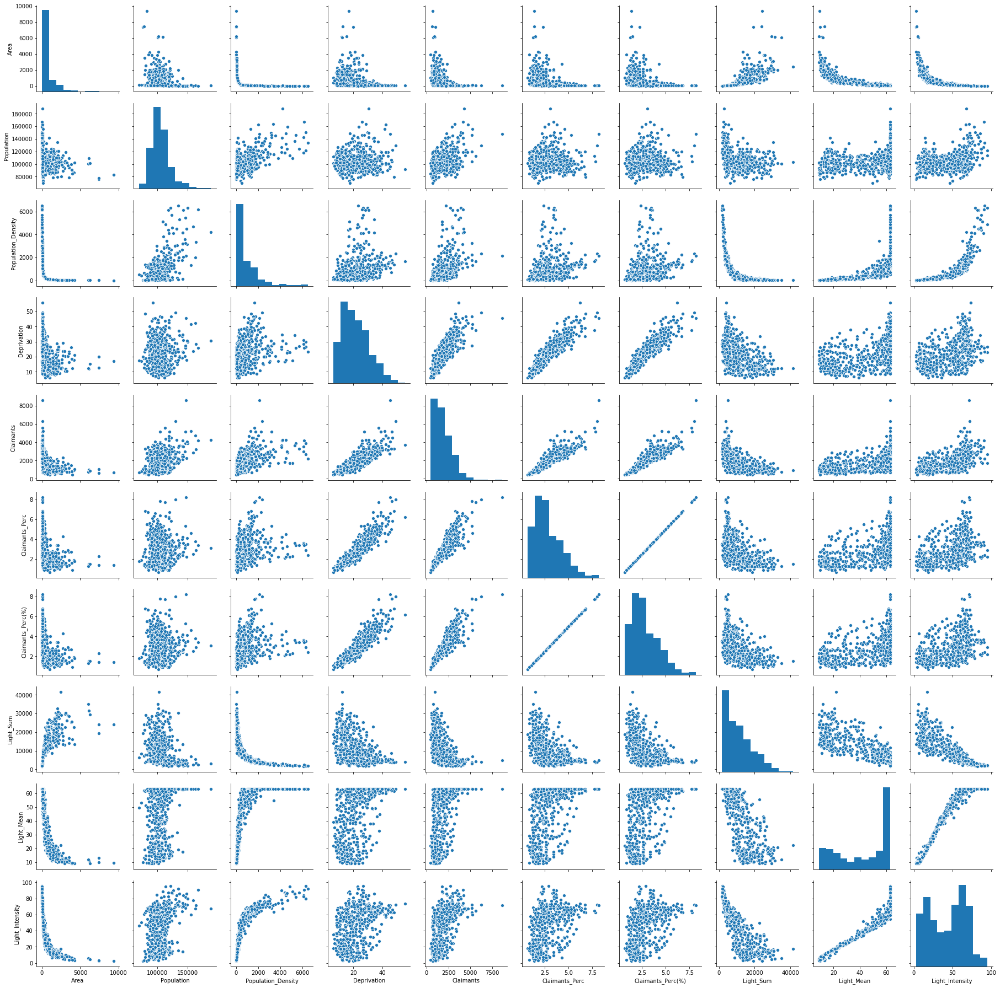

In [226]:
import seaborn as sns
sns.pairplot(map_england)

In [227]:
map_england.corr()

,Area,Population,Population_Density,Deprivation,Claimants,Claimants_Perc,Claimants_Perc(%),Light_Sum,Light_Mean,Light_Intensity
Area,1.000000,-0.204150,-0.408017,-0.299641,-0.399132,-0.358676,-0.358676,0.699818,-0.725212,-0.696425
Population,-0.204150,1.000000,0.547289,0.081877,0.423627,0.052341,0.052341,-0.235363,0.242230,0.325529
Population_Density,-0.408017,0.547289,1.000000,0.335010,0.546701,0.319180,0.319180,-0.654435,0.636421,0.777767
Deprivation,-0.299641,0.081877,0.335010,1.000000,0.851170,0.916599,0.916599,-0.483552,0.465173,0.452071
Claimants,-0.399132,0.423627,0.546701,0.851170,1.000000,0.906239,0.906239,-0.556003,0.568155,0.587065
Claimants_Perc,-0.358676,0.052341,0.319180,0.916599,0.906239,1.000000,1.000000,-0.495493,0.504139,0.480802
Claimants_Perc(%),-0.358676,0.052341,0.319180,0.916599,0.906239,1.000000,1.000000,-0.495493,0.504139,0.480802
Light_Sum,0.699818,-0.235363,-0.654435,-0.483552,-0.556003,-0.495493,-0.495493,1.000000,-0.773624,-0.806791
Light_Mean,-0.725212,0.242230,0.636421,0.465173,0.568155,0.504139,0.504139,-0.773624,1.000000,0.969876
Light_Intensity,-0.696425,0.325529,0.777767,0.452071,0.587065,0.480802,0.480802,-0.806791,0.969876,1.000000


In conclusion, it seems that perhaps light data is not the best as an explanatory variable of the changes in urban dynamics in the UK.

[Note: A simple regression analysis was run with poor results.]

### But Let's Do a Cool Map:

To sum up our table, it is always useful to visualise this with a map:

In [60]:
map_england_hightolow = map_england.sort_values(by='Light_Intensity', ascending=False)
map_england_lowtohigh = map_england.sort_values(by='Light_Intensity', ascending=True)

In [9]:
import holoviews as hv
import geoviews as gv
import geoviews.tile_sources as gts
from geoviews import dim, opts

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
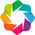

:Overlay
   .WMTS.I                                        :WMTS   [Longitude,Latitude]
   .Polygons.A_50_Highest_Light_Intensity_Regions :Polygons   [Longitude,Latitude]   (PCON13NM,Light_Intensity,Population,Population_Density,Deprivation,Claimants,Claimants_Perc)

In [63]:
gv.extension('bokeh')
plot_opts = dict(tools=['hover'], width=750, height=700, color_index='Light_Intensity',
                 colorbar=True, toolbar='above', xaxis=None, yaxis=None)
gts.ESRI *gv.Polygons(map_england_hightolow[:50], vdims=[('PCON13NM', 'Name'), ('Light_Intensity', 'Light Intensity'),
                                                         ('Population', 'Population'),
                                                         ('Population_Density', 'Population Density'),
                                                         ('Deprivation', 'Deprivation Ranking'), 'Claimants', ('Claimants_Perc', 'Claimants Percentage(%)')],
                                                         label = '50 Highest Light Intensity Regions').opts(plot=plot_opts, style=dict(alpha=0.7))

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
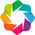

:Overlay
   .WMTS.I                                       :WMTS   [Longitude,Latitude]
   .Polygons.A_50_Lowest_Light_Intensity_Regions :Polygons   [Longitude,Latitude]   (PCON13NM,Light_Intensity,Population,Population_Density,Deprivation,Claimants,Claimants_Perc)

In [78]:
gv.extension('bokeh')
plot_opts = dict(tools=['hover'], width=750, height=700, color_index='Light_Intensity',
                 colorbar=True, toolbar='above', xaxis=None, yaxis=None)
gts.ESRI *gv.Polygons(map_england_lowtohigh[:50], vdims=[('PCON13NM', 'Name'), ('Light_Intensity', 'Light Intensity'),
                                                         ('Population', 'Population'),
                                                         ('Population_Density', 'Population Density'),
                                                         ('Deprivation', 'Deprivation Ranking'), 'Claimants', ('Claimants_Perc', 'Claimants Percentage(%)')],
                                                         label = '50 Lowest Light Intensity Regions').opts(plot=plot_opts, style=dict(alpha=0.7))

# Final Note: Let's Turn to China Quickly Though:

But before finishing off with lights, after doing some research on lights for economic indicators, I found that lights are better to measure growth in less economically developed countries.

Re-looking at the VIIRS dataset I saw that there is historical data on lights for 1993-2013, we can match this with China' GDP growth to see how this matches up.

Let's take the example of comparing 1993 with 2013 in China by lights:

In [3]:
China_geo = gpd.read_file('China.geojson.json')
China_poly = China_geo.geometry[:]

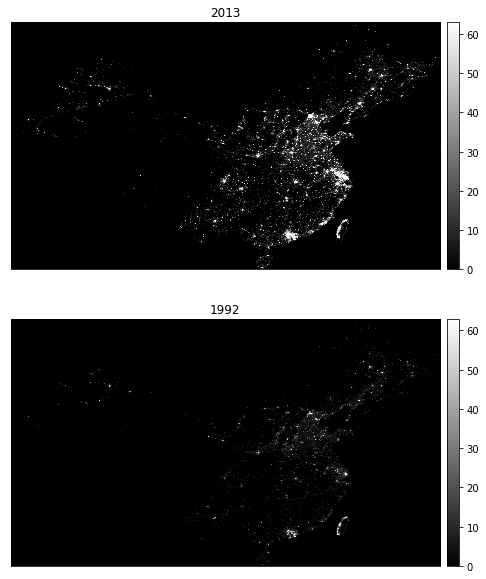

In [4]:
with rio.open('F182013.v4/F182013.v4c_web.stable_lights.avg_vis.tif') as src:
    test_crop1, meta = es.crop_image(src, China_poly)
    test_crop1=test_crop1.astype('uint8')
    
with rio.open('F101993.v4/F101993.v4b_web.stable_lights.avg_vis.tif') as src:
    test_crop2, meta = es.crop_image(src, China_poly)
    test_cro2p=test_crop2.astype('uint8')

fig, ax = plt.subplots(2, figsize = (10,10))

ep.plot_bands(test_crop1[0], cmap='gray', ax=ax[0], title = '2013')#, extent = test_crop_extent)
ep.plot_bands(test_crop2[0], cmap='gray', ax=ax[1], title = '1992')
plt.show()

Here we can see that there is a very stark difference in the light landscape. Now let's do what we did with the England lights, but look at *all* the lights and compare that to GDP growth.

### China Constituency Data:

In [10]:
China_geo = gpd.read_file('China.geojson.json')

In [11]:
#delete Macao, Hong Kong and Taiwan (since GDP data not part of it):
China_geo = China_geo.drop([32,33, 28])
China_geo.shape[0]

31

Translation of Names:

In [12]:
eng_names = ['Xinjiang', 'Tibet', 'Inner Mongolia', 'Qinghai', 'Sichuan',
           'Heilongjiang', 'Gansu', 'Yunnan', 'Guangxi', 'Hunan', 'Shaanxi',
           'Guangdong', 'Jilin', 'Hebei', 'Hubei', 'Guizhou', 'Shandong',
           'Jiangxi', 'Henan', 'Liaoning', 'Shanxi', 'Anhui', 'Fujian',
           'Zhejiang', 'Jiangsu', 'Chongqing', 'Ningxia', 'Hainan',
           'Beijing', 'Tianjin', 'Shanghai']

China_geo['Names'] = eng_names

In [13]:
China_geo = China_geo.reset_index()
China_geo.head()

,index,id,size,name,childNum,geometry,Names
0,0,65,550,新疆维吾尔自治区,18,"POLYGON ((96.41600 42.75880, 96.41600 42.71480...",Xinjiang
1,1,54,550,西藏自治区,7,"POLYGON ((79.01370 34.32130, 79.10160 34.45310...",Tibet
2,2,15,450,内蒙古自治区,12,"POLYGON ((97.20700 42.80270, 99.49220 42.58300...",Inner Mongolia
3,3,63,800,青海省,8,"POLYGON ((89.73630 36.07910, 89.91210 36.07910...",Qinghai
4,4,51,900,四川省,21,"POLYGON ((101.77730 33.53030, 101.86520 33.574...",Sichuan


In [14]:
China_geo = China_geo.drop(['index', 'id', 'size'], axis=1)

### GDP Data:

In [15]:
china_regional_gdp = pd.read_excel('China_Regional_GDP.xlsx')
china_regional_gdp = china_regional_gdp.drop([2018, 2017, 2016, 2015, 2014], axis=1)
china_regional_gdp = china_regional_gdp.set_index(['Province'])
china_regional_gdp = china_regional_gdp.sort_index()
china_regional_gdp

,2013,2012,2011,2010,2009,2008,2007,2006,2005,2004,...,2002,2001,2000,1999,1998,1997,1996,1995,1994,1993
Province,,,,,,,,,,,,,,,,,,,,,
Anhui,"19,229.34","17,212.05","15,300.65","12,359.33","10,062.82","8,851.66","7,360.92","6,112.50","5,350.17","4,759.30",...,"3,519.72","3,246.71","2,902.09","2,712.34","2,542.96","2,347.32","2,093.30","1,810.66","1,320.43","1,037.14"
Beijing,"19,800.81","17,879.40","16,251.93","14,113.58","12,153.03","11,115.00","9,846.81","8,117.78","6,969.52","6,033.21",...,"4,315.00","3,707.96","3,161.66","2,678.82","2,377.18","2,077.09","1,789.20","1,507.69","1,145.31",886.21
Chongqing,"12,783.26","11,409.60","10,011.37","7,925.58","6,530.01","5,793.66","4,676.13","3,907.23","3,467.72","3,034.58",...,"2,232.86","1,976.86","1,791.00","1,663.20","1,602.38","1,509.75","1,315.12","1,123.06",833.60,608.53
Fujian,"21,868.49","19,701.78","17,560.18","14,737.12","12,236.53","10,823.01","9,248.53","7,583.85","6,554.69","5,763.35",...,"4,467.55","4,072.85","3,764.54","3,414.19","3,159.91","2,870.90","2,484.25","2,094.90","1,644.39","1,114.20"
Gansu,"6,330.69","5,650.20","5,020.37","4,120.75","3,387.56","3,166.82","2,703.98","2,277.35","1,933.98","1,688.49",...,"1,232.03","1,125.37","1,052.88",956.32,887.67,793.57,722.52,557.76,453.61,372.24
Guangdong,"62,474.79","57,067.92","53,210.28","46,013.06","39,482.56","36,796.71","31,777.01","26,587.76","22,557.37","18,864.62",...,"13,502.42","12,039.25","10,741.25","9,250.68","8,530.88","7,774.53","6,834.97","5,933.05","4,619.02","3,469.28"
Guangxi,"14,449.90","13,035.10","11,720.87","9,569.85","7,759.16","7,021.00","5,823.41","4,746.16","3,984.10","3,433.50",...,"2,523.73","2,279.34","2,080.04","1,971.41","1,911.30","1,817.25","1,697.90","1,497.56","1,198.29",871.70
Guizhou,"8,086.86","6,852.20","5,701.84","4,602.16","3,912.68","3,561.56","2,884.11","2,338.98","2,005.42","1,677.80",...,"1,243.43","1,133.27","1,029.92",937.50,858.39,805.79,723.18,636.21,524.46,417.69
Hainan,"3,177.56","2,855.54","2,522.66","2,064.50","1,654.21","1,503.06","1,254.17","1,065.67",918.75,819.66,...,642.73,579.17,526.82,476.67,442.13,411.16,389.68,363.25,331.98,260.41


Let's now stack these values so they are:
* In alphabetical order
* AND descending Time order
(i.e. Anhui 2013, 2012....Beijing 2013, 2012...)

In [18]:
stacked_values = china_regional_gdp.stack().to_list()

In [19]:
len(stacked_values)

651

### China Light Data

As we have done this with the UK data we know how to get the data and generate light values.

*But this time* we will loop through my directory to get the light values for *each Chinese constituency* for the year 1993 to 2013.

In [20]:
sum_list = []
light_mean = []
year_order = []
region_name = []

def append_list(country):
    for filename in os.listdir():
        if filename.endswith('.v4'):
            path1 = filename
            for file in os.listdir(path1):
                if file.endswith('stable_lights.avg_vis.tif'):
                    path2 = path1+"/"+file
                    for i in range(country.shape[0]):
                        with rio.open(path2) as src:
                            cropped_image, meta = es.crop_image(src, country.geometry[i:i+1])
                            cropped_image=cropped_image.astype('uint8')
                            cropped_image_ma = np.ma.masked_equal(cropped_image[0], 0)
                            sum_list.append(np.sum(cropped_image_ma))
                            light_mean.append(np.mean(cropped_image_ma))
                            year_order.append(filename[3:7])
                            region_name.append(China_geo.Names[i])

In [21]:
append_list(China_geo)

In [22]:
China_province_light = pd.DataFrame()
China_province_light['Year'] = year_order
China_province_light['Region'] = region_name
China_province_light['Light_Sum'] = sum_list
China_province_light['Light_Mean'] = light_mean

In [23]:
pd.set_option('max_rows', 1000)
China_province_light

,Year,Region,Light_Sum,Light_Mean
0,2002,Xinjiang,625581,11.179873
1,2002,Tibet,24460,9.536062
2,2002,Inner Mongolia,525099,8.559210
3,2002,Qinghai,82241,8.641484
4,2002,Sichuan,567606,8.398775
5,2002,Heilongjiang,1192458,7.782805
6,2002,Gansu,303494,7.764974
7,2002,Yunnan,489555,8.385950
8,2002,Guangxi,412904,7.172457
9,2002,Hunan,434790,6.969911


We need to reset it so that it goes Alphabetical order and then Year descending:

In [24]:
China_province_light_new = China_province_light.sort_values(by=['Region', 'Year'], ascending = [True, False])
China_province_light_new

,Year,Region,Light_Sum,Light_Mean
362,2013,Anhui,1357723,14.449396
331,2012,Anhui,1145487,12.918249
238,2011,Anhui,1208189,10.523378
145,2010,Anhui,1249879,11.836200
486,2009,Anhui,598121,9.175324
579,2008,Anhui,854856,8.234100
300,2007,Anhui,867637,7.834477
393,2006,Anhui,613038,7.910270
176,2005,Anhui,567847,5.564945
207,2004,Anhui,642728,6.393204


And *now* we can append the GDP values per region:

In [25]:
China_province_light_new['GDP(100m Yuan)'] = stacked_values
China_province_light_new.head()

,Year,Region,Light_Sum,Light_Mean,GDP(100m Yuan)
362,2013,Anhui,1357723,14.449396,"19,229.34"
331,2012,Anhui,1145487,12.918249,"17,212.05"
238,2011,Anhui,1208189,10.523378,"15,300.65"
145,2010,Anhui,1249879,11.836200,"12,359.33"
486,2009,Anhui,598121,9.175324,"10,062.82"


In [26]:
China_province_light_new.dtypes

Year               object
Region             object
Light_Sum           int64
Light_Mean        float64
GDP(100m Yuan)     object
dtype: object

We need to replace GDP to float:

In [27]:
China_province_light_new['GDP(100m Yuan)']=China_province_light_new['GDP(100m Yuan)'].apply(lambda i: float(i.replace(',',''))).to_list()

Now we can see the Correlation Matrix:

In [28]:
China_province_light_new.corr()

,Light_Sum,Light_Mean,GDP(100m Yuan)
Light_Sum,1.000000,0.227092,0.816838
Light_Mean,0.227092,1.000000,0.466166
GDP(100m Yuan),0.816838,0.466166,1.000000


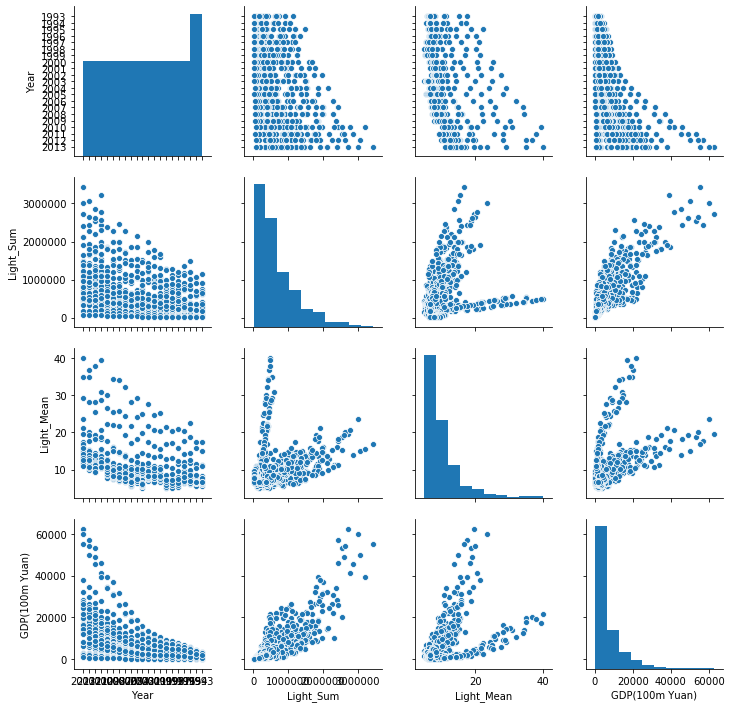

In [34]:
sns.pairplot(China_province_light_new)

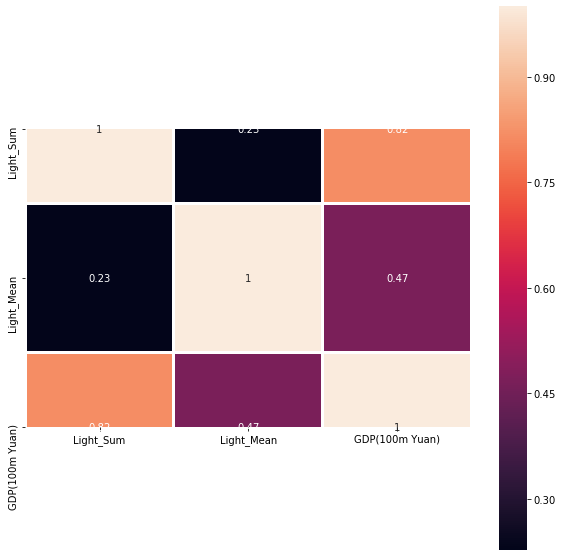

In [33]:
import seaborn as sns
f, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(China_province_light_new.corr(), annot=True, square=True, linewidth=2)

## Getting a Regression:

In [44]:
X=China_province_light_new[['Light_Sum']]
Y=China_province_light_new[['GDP(100m Yuan)']]

In [50]:
from sklearn.model_selection import train_test_split

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=.25, random_state=42)
print(X_train.shape)
print(X_test.shape)
print(Y_train.shape)
print(Y_test.shape)

(488, 1)
(163, 1)
(488, 1)
(163, 1)


In [51]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error


lin_model = LinearRegression()
lin_model.fit(X_train, Y_train)
#Here is looking for the optimum value of theta0, theta1

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [52]:
print(lin_model.intercept_)
print(lin_model.coef_)

[-1540.60380329]
[[0.01308794]]


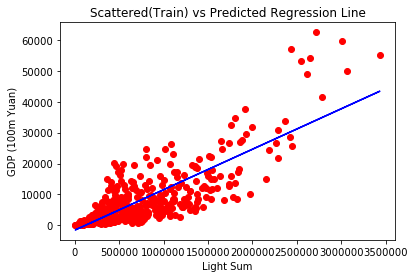

In [53]:
plt.scatter(X_train, Y_train, color = "red")
plt.plot(X_train, lin_model.predict(X_train), color = "blue")
plt.title("Scattered(Train) vs Predicted Regression Line")
plt.xlabel("Light Sum")
plt.ylabel("GDP (100m Yuan)")
plt.show()

Finally, let's get metrics on this Regression:

In [54]:
from sklearn import metrics

y_train_predict = lin_model.predict(X_train)

print("The model performance for training set")
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from math import sqrt
print("MAE:", mean_absolute_error(Y_train, y_train_predict))
print("MSE:", mean_squared_error(Y_train, y_train_predict))
print("RMSE:", sqrt(mean_squared_error(Y_train, y_train_predict)))
print("R2 Score:", r2_score(Y_train, y_train_predict))

print("\n")

y_test_predict = lin_model.predict(X_test)
print("The model performance for testing set")
print("MAE:", mean_absolute_error(Y_test, y_test_predict))
print("MSE:", mean_squared_error(Y_test, y_test_predict))
print("RMSE:", sqrt(mean_squared_error(Y_test, y_test_predict)))
print("R2 Score:", r2_score(Y_test, y_test_predict))

The model performance for training set
MAE: 3575.5164088143492
MSE: 28911418.908860553
RMSE: 5376.933969174305
R2 Score: 0.6739203808745156


The model performance for testing set
MAE: 3666.2918613570773
MSE: 29080462.01056815
RMSE: 5392.6303424737125
R2 Score: 0.6427857227634584


RMSE in test set is greater than training set; this is overfitting.

*Let's use cross-validation to help solve this:*

In [55]:
from sklearn.model_selection import cross_val_score
model = lin_model.fit(X_train, Y_train)
np.mean(cross_val_score(model, X, Y, cv=3))

0.6616320123489388

With cross validation we get a higher R2 than the Test, but a lower score than the Train.